# Toy LM-GC Plasticity Model

### Description
This is a simplified periodic representation model where we represent:
1. several GC modules whose activity is already periodic in time (consistently with pre-existing CAN dynamics that we find in our data);
2. a single LM unit (landmark cell)
3. two inputs to LM:

    - $I_{\text{ext}}$: external landmark drive (when visual landmarks are visible - NTS task)
    - $I_{\text{int}}$: internal input from GC cells, weighted by plastic synapses

### Assumptions this model relies on:
1. No real movement, but velocity input comes from efference copy / reafference during joystick deflections

2. model units (GC units) interact with LM units (landmark neurons)

3. plastic connections between GC units and LM units

### What this model explains
How the network can learn which GC population encodes the external landmark sequence and later **replay endogenous landmarks without sensory input**

*(Rk)* it is not doing path integration with noise yet; it is about associating the LM with the correct GC module and phase

**Goal**: establish that $I_{\text{int}}$ can emulate $I_{\text{ext}}$.
This simple model provides a candidate circuit mechanism for the storage of external landmarks in the EC, and shows that a subset of EC units whose phase and frequency matches external structure could drive LM.

### Model for Learning
- While $I_{\text{ext}}$ is *ON*, updates $GC \mapsto LM$ weights with a Hebbian-like rule (Oja's rule). Conceptually, LM strenghtens connections from those GC cells whose *period* and *phase* match this external drive

- After learning, $I_{\text{ext}}$ is turned *OFF* (MNAV), and LM should still show bumps at the correct times purely from GC inputs ($I_{\text{int}}$))

### Modelling GC units (freqs and phases)
A Grid-cell module is a population of cells that all share the same temporal period but can have different phases.

Each EC module represents a **periodic time signal**, and can be seen as a set of **oscillators**, where each module oscillates at some frequency (with some period). Neurons in the same module can have different phases (when within a cycle a cell's bump occurs). It can be seen as the horizontal shift of the same oscillating function

Eg. all cells in the module oscillate with period $0.65s$

$r_i(t) = \max (0, \sin (2\pi ft +\phi_i))$

- All share frequency $f = \frac{1}{0.65}Hz$
- Each has a different phase $\phi_i \in [0, 2\pi]$, where $2\pi$ radians correspond to a full oscillation (cycle)

Need to feed the model:
- *Nmodule*: number of EC modules
- *LM_module*: which module's frequency matches the LM ('target module')
- *LM_phase*: target phase: phase (in degrees) where LM recurs
- *lr*: learning rate

## Clean Mathematical Formulation

### 1. Dimensions and Parameters
- $M$: number of EC modules

- $K = 360$: neurons per module (they do not represent actual *physical* neurons, but instead represent the number of phase bins allowing for fine sampling of the internal temporal phase and for smoother representation)

- $t \in \{1,2,...,T\}$: discrete time steps

- $\text{scale}[i]$: speed scaling factor for module $i$

- $\text{LM}_{\text{module}}$ = index $m^* \in \{1,\dots, M\}$

- $\text{LM}_{\text{phase}}$ = index $\phi^* \in \{0, \dots, K-1\}$

### 2. Construct EC Modules: bump matrices
- For each module $i$:

    1.  create a bump vector $g_i \in \mathbb{R}^K$ (Gaussian over indices $0,\dots, K-1$), where each of the $360$ entries are used as the positions on the circular attractor. So the entries in $g_i$ characterize the shape of the bump in a cycle, and it is discretized by the $360$ neurons (bins) to model the resolution of the Gaussian curve.

    2. phase shifting: sliding the bump along the neuron axis and wrap around the edges $\rightarrow$ model bump as it shifts through all $360$ phase positions. Here we use **circshift**

so for each module $i$ we have a matrix $E_i \in \mathbb{R}^{K\times K}$ where the column vector at phase $phi$ is $E_i[:, \phi]$ = circshift($g_i, \phi$):

$E_i = [g_i, \text{shift}(g_i, \phi=1), \text{shift}(g_i, \phi=2), \dots, \text{shift}(g_i, \phi = 359)] = [e_i(0), \dots, e_i(K-1)]$

### 3. Time evolution of phase
All modules share the same ring count of $K$ neurons. The only difference is **how fast they move through the ring**

Given external (global) time $t$:
1. Convert global time $t$ into the module's internal time $t_i$:\
$t_i = \text{round}(\frac{t}{\text{scale}[i]})$

2. Convert that internal time into a **phase index** $\phi_i(t)$ on the ring:\
$\phi_i(t) = (t_i-1) \mod K$

3. Wrap around using modulo because phase is circular

*rk)* The scale factor denotes the underlying period needed to travel one space unit (bin), so:
- larger scale $\Longrightarrow$ moves more slowly
- smaller scale $\Longrightarrow$ moves faster

#### Velocity and Scale
$\text{velocity}[i] \propto \frac{1}{\text{scale}[i]}$

### 4. EC activity in terms of time
The current EC activity for module $i$ can thus be written as a function of time:\
$x_i(t) = E_i[:, \phi_i(t)] \in \mathbb{R}^K$

And then, the matrix storing the current activity of all EC modules at time $t$ can be expressed as:\
$X(t) = [x_i(t), x_2(t), \dots, x_M(t)] \in \mathbb{R}^{K\times M}$

### 5. LM External Pattern
- They build a bump template $g_{LM} \in \mathbb{R}^K$, using $a$ and not scaled by $\text{scale}$

- Given the LM_phase true external phase, if $K\neq 360$, compute $\phi^* = \frac{\text{LM\_phase} \times K}{360}$

- Then, given the *LM_phase* index $\phi^*$, they compute the shifted bump version ($\text{g}_{\text{ext}} = \text{shift}(g_{LM}, \phi^*) \in \mathbb{R}^K$)

- Since there is some module $m^*$ matching the target frequency, we call the phase of that module at time $t$:\
$\phi_{m^*}(t) = (t_{m^*}-1) \mod K$

- Then the external LM is a scalar that depends periodically on the internal phase of a specific module:
- at anyt time $t$ is written as $I_{\text{ext}}(t)$:\
$LM[\phi_{m^*}] = 

# Algorithm

In [129]:
## imports
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

In [132]:
%matplotlib inline

In [133]:
print("Backend:", matplotlib.get_backend())

Backend: inline


In [13]:
class PhaseRingUnit:
    """
    Base class for units that live on the 1D circular ring of K phase bins
    Provides:
    - K: number of neurons in the cells, arranged on a ring (each neuron = a phase bin)
    - base_width: width parameter for the Gaussian bump
    - create_bump(): make a normalized Gaussian bump on the ring
    """

    def __init__(self, K:int, base_width:float):
        self.K = K
        self.base_width = base_width
    
    def create_bump(self, width_scale:float = 1.0, amp:float = 1.0) -> np.ndarray:
        """
        Returns a Gaussian over indices 0, ..., K-1
        
        Parameters:
        -----------
        - width_scale: float
            multiplies base_width to set effective std of the Gaussian
        - amplitude :float
            amplitude of the bump
        
        Returns:
        --------
        bump : np.ndarray, shape:(K,)
        """
        K = self.K
        width = self.base_width * width_scale
        # indices centered around 0
        z = np.arange(-K/2, K/2)
        kernel = np.exp(-z**2 / (2 * width**2))
        kernel = amp * kernel / np.max(kernel)
        return kernel   # shape: (K,)

In [14]:
class ECModule(PhaseRingUnit):
    """
    One EC (grid-cell) module:
    - K neurons arranged on a ring (each neuron = a phase bin)
    - activity at time t: bump on the ring, shifted according to t / scale for every possible phase on the ring
    """

    def __init__(self, K:int, base_width:float, scale:float):
        """
        Parameters:
        -----------
        K:int
            Number of neurons / phase bins
        base_width:float
            base width parameter for the Gaussian bump
        scale:float
            temporal scaling factor for this module, characterizing frequency
            smaller scale => phase advances faster => higher effective frequency
            larger scale => phase advances slower => lower effective frequency
        """
        super().__init__(K=K, base_width=base_width)
        self.scale = scale

        # precompute base bump g_i (Gaussian over neuron indices, with static shape and dynamic position over time)
        self.bump = self.create_bump(width_scale = self.scale, amp=1.0)
    


    def phase_index(self, t: int) -> int:
        """
        Compute current phase index for the current module at global time t
        """
        t_i = int(np.round(t / self.scale))
        phi_i = (t_i -1) % self.K
        return phi_i


    def activity(self, t:int) -> np.ndarray:
        """
        Population activity vector x_i(t)
            shape: (K, )
        It is the circularly shifted version of the template module bump, according to the phase index at time t phi_i(t)
        """
        phi_i = self.phase_index(t)
        return np.roll(self.bump, phi_i)
    



In [ ]:
class LandmarkUnit(PhaseRingUnit):
    """
    Landmark (LM) external input pattern across the ring of K phase bins

    Important: this is NOT the LM unit itself, which is a single scalar unit
    This class encodes:
    - lm_ext : np.ndarray (shape: (K,))
        external LM drive vector
        lm_ext[k] is the external LM drive vector present if the internal phase is =k
    - time dependence comes only when we sample lm_ext at phase phi_star of the LM-matched module
    """

    def __init__(self, K:int, base_width:float, lm_phases_deg:float , amp:float = 1.0):
        """
        Parameters:
        -----------
        - K:
            number of bins (same as EC module)
        - base_width:
            base_width parameter for the Gaussian bump (same as EC module)
        - lm_phase_deg: float or list of float
            landmark phase in degrees 
        - amp-> amplitude of each landmark bump
        """
        super().__init__(K=K, base_width = base_width)
        self.lm_phases_deg = np.atleast_1d(lm_phases_deg).astype(float)

        self.base_bump = self.create_bump(width_scale = 1.0, amp = amp)
        self.lm_ext = self.build_lm_ext() # shape (K,)

    
    def build_lm_ext(self) -> np.ndarray:
        """
        Sum bumps at the requested phases (if there is more than one exernal stimulus)
        Here there is no external scale:
            phi / K = lm_phase_deg / 360

        Time independent => only mapping a landmark angle to a bin
        - LM external bump itself does not evolve in time
        """
        lm_ext = np.zeros(self.K)
        for phase_deg in self.lm_phases_deg:
            idx = int(np.round(phase_deg / 360 * self.K)) % self.K
            lm_ext += np.roll(self.base_bump, idx)
        return lm_ext


    def external_input(self, phase_idx:int) -> float:
        """
        Given a current phase index (eg. LM-matched module), return the scalar external input lm_ext[phi]
        I_ext(t) = lm_ext[phi_m^* (t)] 
        """
        return float(self.lm_ext[phase_idx % self.K])


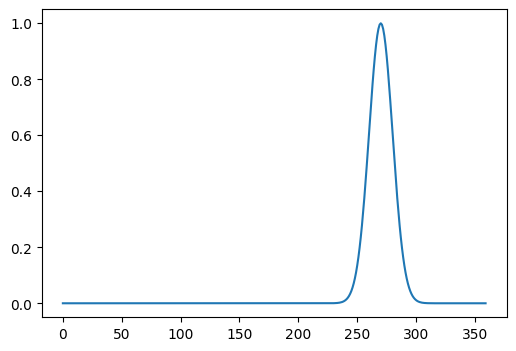

In [43]:
landmark = LandmarkUnit(K= 360, base_width = 10, lm_phases_deg = 90)
bump = landmark.create_bump()
plt.figure(figsize = (6,4))
plt.plot(landmark.lm_ext)
plt.show()

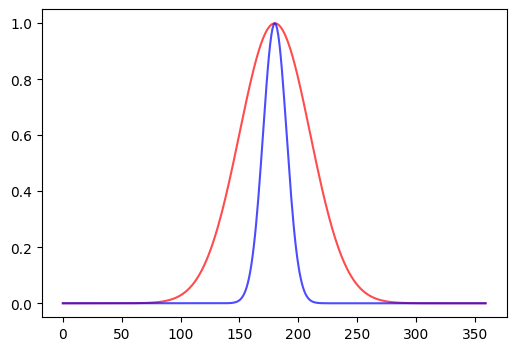

In [44]:
mod1 = ECModule(K= 360, base_width = 10, scale = 3)
bump1 = mod1.bump
mod2 = ECModule(K=360, base_width =10, scale = 1)
bump2 = mod2.bump
plt.figure(figsize = (6,4))
plt.plot(bump1, color = 'r', alpha = 0.7)
#plt.plot(mod1.activity(t=30), color = 'r', alpha = 0.5)
plt.plot(bump2, color ='b', alpha = 0.7)
#plt.plot(mod2.activity(t=30), color = 'b', alpha=0.5)

plt.show()

In [62]:
mod1.K

360

In [59]:
K = 360
a = 10.0
scale1 = 1.0
scale2 = 2.0
module1 = ECModule(K=K, base_width=a, scale=scale1)
module2 = ECModule(K=K, base_width=a, scale=scale2)

fig, ax = plt.subplots(figsize=(6, 4))
line1, = ax.plot([], [], lw=2)
line2, = ax.plot([], [], lw=2)
ax.set_xlim(0, K - 1)
ax.set_ylim(0, 1.1)
ax.set_xlabel("Neuron / phase bin")
ax.set_ylabel("Activity")

T = 400
t_values = np.arange(1, T + 1)

def init():
    line1.set_data([], [])
    line2.set_data([], [])
    return line1, line2,

def update(frame_idx):
    t = t_values[frame_idx]
    x = np.arange(K)
    y1 = module1.activity(t)
    y2 = module2.activity(t)
    line1.set_data(x, y1)
    line2.set_data(x, y2)
    ax.set_title(f"ECModule bump, t = {t}")
    return line1, line2,

ani = FuncAnimation(fig, update, frames=len(t_values),
                    init_func=init, interval=50, blit=True)

HTML(ani.to_jshtml())


<IPython.core.display.Javascript object>

Remark:

in their toy model, spatial scale and temporal scale are tied together --> modules with different scales not only to determine how fast the phase advances in a time interval, but also have different bump widths

larger spatial period $\Longleftrightarrow$ slower temporal frequency


In [112]:
class LMGCPlasticityModel:
    """
    LM-GC Plasticity Model with Oja's learning (Hebbian rule) rule

    Ingredients:
    -----------
    - M EC modules (each moving a Gaussian bump around a ring of K neurons)
    - 1 LM neuron (scalar activity)
    - external LM pattern sampled at LM module's phase
    - Weights W (shape (K x M)) from each module's neuron to LM 

    Learning rule at each time step t:
    ---------------------------------
    X(t):
        matrix (K, M) of EC activities (column i x_i(t)= module i)
    s_int(t)
        sum_{i,m} W[i,m] X[i,m]
    s_ext(t)
        external input evaluated at the phase of module m^* at time t
    s => LM activity:
        s_int + s_ext during learning
        s_int only after external input stops
    W = W + lr * s * [X - s*W]
    then mean-center each column (per-module mean subtraction)
    """

    def __init__(
        self,
        list_modules : list[ECModule],
        landmark: LandmarkUnit,
        lm_module_index: int,
        eta: float,
        t_off: int,
        weight_init_std: float | None=None,
        seed : int | None= None
        ):
        """
        Parameters:
        -----------
        - list_modules
            the EC modules (length M)
        - landmark
            LM external pattern object
        - lm_module_index
            index of the module whose frequency matches LM
        - eta
            learning rate in Oja's rule
        - t_off
            time step at wich external input turns off
        - weight_init_std
            stdev of initial weight distribution. If none, uses 1/(K*M)
        - seed for reproducibility
        """

        if seed is not None:
            np.random.seed(seed)

        assert len(list_modules) > 0 #need at least one module in the model
        self.modules = list_modules
        self.landmark = landmark
        self.lm_module_index = lm_module_index
        self.eta = eta
        self.t_off = t_off

        self.K = self.modules[0].K
        self.M = len(list_modules)

        assert all(m.K == self.K for m in self.modules)
        assert 0 <= self.lm_module_index < self.M

        if weight_init_std is None:
            weight_init_std = 1 / (self.K * self.M)
        
        # W weight matrix (K x M)
        self.W = weight_init_std * np.random.randn(self.K, self.M)
        self.W_init = self.W.copy()

        ## logs for analyses
        self.weight_history = []
        self.learning_flags = []
        self.time_points = []

    def get_initial_weights(self):
        return self.W_init

    def Oja_update(self, W, X, s, eta):
        W += eta * s * (X - s * W)
        return W

    def mean_sub(self, W):
        col_means = W.mean(axis=0, keepdims=True)
        W -= col_means
        return W

    def compute_EC_data(self, t:int):
        X = np.zeros((self.K, self.M))
        phases_track = np.zeros(self.M, dtype=int)
        for i, module in enumerate(self.modules):
            phases_track[i] = module.phase_index(t)
            X[:, i] = module.activity(t)
        return X, phases_track

    def LM_total_input(self, s_int:float, s_ext:float|None, t:int):
        if t < self.t_off:
            s = s_int + s_ext
            flg_ext_input = 1
        else:
            s = s_int
            flg_ext_input = 0
        return s, flg_ext_input


    def step(self, t:int) -> dict:
        """
        A single simulation step. At time t:
        - compute EC activity at time t X(t)
        - compute internal stimulus s_int, external stimulus and overall LM activity
        - update weight matrix W

        -----------------------
        phases_track = tracks the phase index (neuron bin on the ring from 0 to K-1) module i is on at time t
            shape: (M,)
        """

        # 1) compute EC modules activity
        X, phases_track = self.compute_EC_data(t)
        
        # 2) internal input s_int = sum_i {W^T_i * X_i}
        s_int = float(np.sum(self.W * X))

        # 3) external input from LM-matched module 
        phi_lm = phases_track[self.lm_module_index]
        s_ext = self.landmark.external_input(phi_lm)

        # 4) LM activity received
        s, learning_flag = self.LM_total_input(s_int, s_ext, t)
        
        # 5) Oja update
        self.W = self.Oja_update(self.W, X, s, self.eta)

        # 6) mean subtraction per column
        self.W = self.mean_sub(self.W)

        return {
            "X": X,
            "phases_track" : phases_track,
            "s_int": s_int,
            "s_ext": s_ext,
            "s": s,
            "learning_flag": learning_flag
        }



    def train(self, T:int, snapshot_interval:int, store_hist:bool = True):
        """
        Run the simulation for T time steps
        Save a snapshot of the current state of the weights once every 'snapshot' steps
        If store_hist = True, save history of weights, phase_indices and time indices
        """
        for t in range(1, T+1):
            current_run = self.step(t)

            if store_hist and (t % snapshot_interval == 0):
                self.weight_history.append(self.W.copy())
                self.learning_flags.append(current_run["learning_flag"])
                self.time_points.append(t)


    def get_final_weights(self)-> np.ndarray:
        return self.W


    def get_history(self)-> dict:
        return {
            "weights": np.array(self.weight_history),
            "learning_flags": np.array(self.learning_flags),
            "time_points": np.array(self.time_points)
            }



Thus in this simple model an LM unit receives input from external activity as well as from CAN units associated 

in the presence of external landmarks (NTS), synapses are modified such that CAN inputs mimicked the external input, and when the external landmark was turned off (MNAV), the CAN drive alone was able to emulate that external drive.

We now test the idea that matching dynamics allow CAN units to reproduce LM activity during MNAV, when landmarks are invisible.

in this example, we hardcode that the landmark has scale 1 and base frequency (so it is matched by module 1, which has scale 1 too).

In [150]:
K = 360
Nr_modules = 4
a = 10.0
eta = 1e-7
T = 10000
t_off = T//2

LM_module = 1
LM_phase_deg = 180.0

In [151]:
modules = []
#scales = []
mod_sc = {}
for i in range(Nr_modules):
    exponent = (i + 1) - Nr_modules / 2.0   # i+1 per matchare i=1..Nmodule
    scale_i = 1.1**exponent
    mod_sc[f'{i}'] = scale_i
    modules.append(ECModule(K= K, base_width = a, scale = scale_i))

print(f'modules and scales: {mod_sc}')

modules and scales: {'0': 0.9090909090909091, '1': 1.0, '2': 1.1, '3': 1.2100000000000002}


In [152]:
landmark = LandmarkUnit(K=K, base_width = a, lm_phases_deg = LM_phase_deg)

now we execute the model and store the history weights.

remark: In this toy model, there is no distinction between some learning and inference phase, in the sense that weights always adapt since plasticity is always on, so both in the 'visual' and 'mental' phase with ext LM on and off.

- Before $t < t_\text{off}$, LM learns to align with the external landmark pattern, since weights are updated depending on s_int and s_ext

- After $t > t_\text{off}$, LM continues to adapt, now only driven by internally generated landmark-like signals (so lile consolidation, refinement in their story)

In [153]:
model = LMGCPlasticityModel(
    list_modules = modules,
    landmark = landmark,
    lm_module_index = LM_module,
    eta = eta,
    t_off = t_off,
    seed = 42)

model.train(T=T, snapshot_interval = 500, store_hist=True)

In [154]:
W_final = model.get_final_weights()
W_final

array([[ 0.00032419, -0.00010897,  0.00041058,  0.00101597],
       [-0.00018335, -0.00017555,  0.00105745,  0.00049113],
       [-0.00034678,  0.00036381, -0.00036101, -0.00036534],
       ...,
       [-0.00017439, -0.00020519,  0.00017431,  0.00052518],
       [ 0.0005768 , -0.00041787, -0.00015523,  0.00015482],
       [-0.00019344,  0.00110323,  0.00030176,  0.00046878]],
      shape=(360, 4))

In [155]:
hist = model.get_history()

In [156]:
W_init = model.get_initial_weights()

In [157]:
W_init.shape

(360, 4)

In [158]:
print("||W_final - W_init||_F:",
      np.linalg.norm(W_final - W_init),
      "  ||W_init||_F:", np.linalg.norm(W_init))

||W_final - W_init||_F: 0.0011628982738784417   ||W_init||_F: 0.02603065315184513


In [147]:
hist

{'weights': array([[[ 0.0003244 , -0.00010673,  0.00041086,  0.00101602],
         [-0.00018314, -0.00017331,  0.00105775,  0.0004913 ],
         [-0.00034656,  0.00036606, -0.00036074, -0.00036506],
         ...,
         [-0.00017418, -0.00020295,  0.00017455,  0.00052485],
         [ 0.00057702, -0.00041563, -0.00015498,  0.0001546 ],
         [-0.00019324,  0.00110549,  0.00030203,  0.0004687 ]],
 
        [[ 0.00032425, -0.00010691,  0.00041066,  0.0010158 ],
         [-0.0001833 , -0.00017348,  0.00105755,  0.00049108],
         [-0.00034671,  0.00036589, -0.00036093, -0.00036528],
         ...,
         [-0.00017434, -0.00020312,  0.00017436,  0.00052462],
         [ 0.00057686, -0.0004158 , -0.00015517,  0.00015438],
         [-0.00019339,  0.00110532,  0.00030184,  0.00046847]],
 
        [[ 0.000324  , -0.00010727,  0.00041029,  0.00101719],
         [-0.00018356, -0.00017385,  0.00105718,  0.00049241],
         [-0.00034698,  0.00036552, -0.0003613 , -0.00036402],
         .

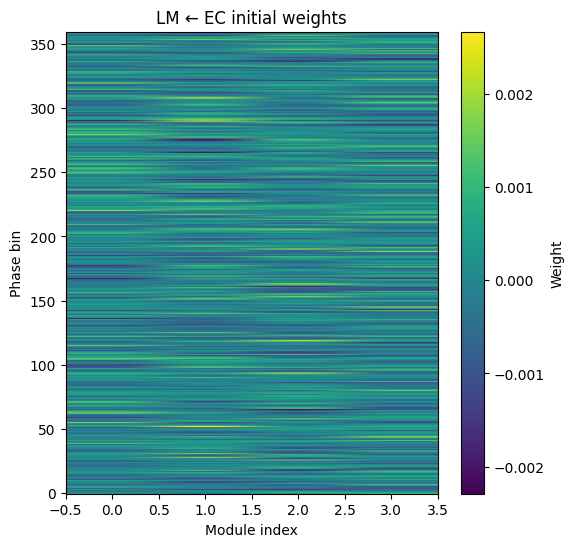

In [148]:
plt.figure(figsize=(6, 6))
plt.imshow(hist['weights'][14], aspect="auto", origin="lower")
plt.colorbar(label="Weight")
plt.xlabel("Module index")
plt.ylabel("Phase bin")
plt.title("LM ← EC initial weights")
plt.show()

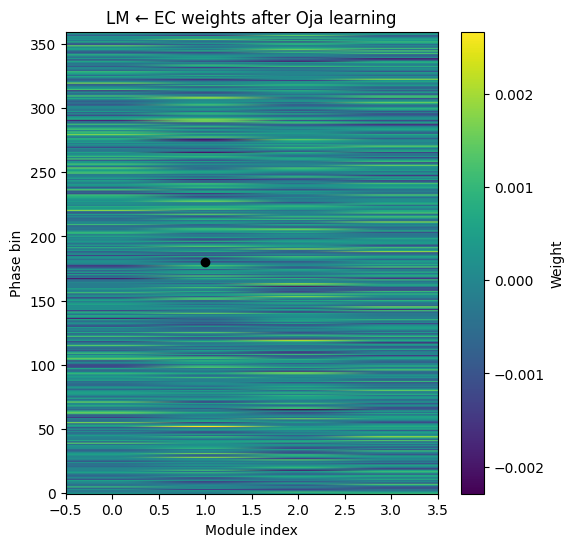

In [146]:
plt.figure(figsize=(6, 6))
plt.imshow(W_final, aspect="auto", origin="lower")
plt.colorbar(label="Weight")
plt.xlabel("Module index")
plt.ylabel("Phase bin")
plt.title("LM ← EC weights after Oja learning")
# opzionale: marcare LM_module e LM_phase_deg
row_idx = int(np.round(LM_phase_deg / 360.0 * K)) % K
plt.plot([LM_module], [row_idx], "ko", markersize=6)
plt.show()

In [163]:
K = 360
Nr_modules = 4
a = 10.0
eta = 1e-7
T = 1000000
t_off = 800000
snapshot_interval = 1000

LM_module = 1
LM_phase_deg = 180.0

In [164]:
model = LMGCPlasticityModel(
    list_modules = modules,
    landmark = landmark,
    lm_module_index = LM_module,
    eta = eta,
    t_off = t_off,
    seed = 42
)

model.train(T=T, snapshot_interval=snapshot_interval, store_hist=True)

W_init  = model.get_initial_weights()
W_final = model.get_final_weights()
hist    = model.get_history()

print("W_init shape:", W_init.shape)
print("W_final shape:", W_final.shape)
print("||W_final - W_init||_F:",
      np.linalg.norm(W_final - W_init),
      "  ||W_init||_F:",
      np.linalg.norm(W_init))

W_init shape: (360, 4)
W_final shape: (360, 4)
||W_final - W_init||_F: 0.0199047289858313   ||W_init||_F: 0.02603065315184513


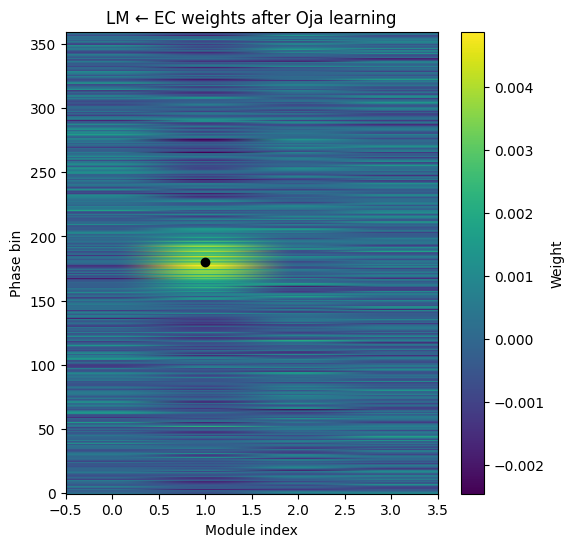

In [165]:
plt.figure(figsize=(6, 6))
plt.imshow(W_final, aspect="auto", origin="lower")
plt.colorbar(label="Weight")
plt.xlabel("Module index")
plt.ylabel("Phase bin")
plt.title("LM ← EC weights after Oja learning")
# opzionale: marcare LM_module e LM_phase_deg
row_idx = int(np.round(LM_phase_deg / 360.0 * K)) % K
plt.plot([LM_module], [row_idx], "ko", markersize=6)
plt.show()